In [63]:
import numpy as np
import pandas as pd
import re
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.preprocessing import Normalizer
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_val_score
import datetime
import matplotlib
from matplotlib import pyplot

import shap
shap.initjs()


In [72]:
#load trained model
modelAbove = xgboost.Booster()
modelAbove.load_model("../TrainedModels/V1/ModelAboveV1.bin")


In [74]:
#get data
predict20180414Df = pd.read_csv("../Data/PredictionAnalysis/V1Features20180414.csv")


In [81]:
#only interested in Snoqualmie pass row
snoqPass20180414 = predict20180414Df[predict20180414Df["Lon"]==-121.4762]

In [82]:
snoqPass20180414

,Date,Lat,Lon,n_f_APCPsurface1HourForecast,n_f_10mWindSpeed1HourForecast,n_f_APCPsurface2HourForecast,n_f_10mWindSpeed2HourForecast,n_f_APCPsurface3HourForecast,n_f_10mWindSpeed3HourForecast,n_f_APCPsurface4HourForecast,...,c_r_Prev3DayWindSlabLikeliness10InPast,c_r_Prev7DayWindSlabLikeliness10InPast,n_r_Prev24HoursPrecipAsRainTotalIn10InPast,n_r_SNOWDAS_SnowDepth_mm10InPast,n_r_SNOWDAS_SWE_mm10InPast,n_r_SNOWDAS_SnowmeltRunoff_micromm10InPast,n_r_SNOWDAS_Sublimation_micromm10InPast,n_r_SNOWDAS_SolidPrecip_kgpersquarem10InPast,n_r_SNOWDAS_LiquidPrecip_kgpersquarem10InPast,n_r_SNOWDAS_SnowpackAveTemp_k10InPast
17039,4/14/2018 12:00:00 AM,47.436135,-121.4762,1.0,3.398061,2.4375,4.554181,5.0625,5.011555,8.0,...,0,0,0.0,3270,1172,76,-17,107,0,273


In [86]:
#remove date/lat/lon columns
snoqPass20180414Clean = snoqPass20180414.iloc[:, 3:]

In [87]:
predict20180414DMatrix = xgboost.DMatrix(snoqPass20180414Clean)

In [88]:
#make the prediction
resultAbove = modelAbove.predict(predict20180414DMatrix)

In [89]:
#indicies are
#Considerable: 0
#High: 1
#Low: 2
#Moderate: 3

resultAbove

array([[0.16430707, 0.42940453, 0.27681193, 0.12947646]], dtype=float32)

Predicted value is High

In [90]:
#similar value produced by NWAC
%%HTML
<iframe width="100%" height="350" src="https://www.nwac.us/avalanche-forecast/avalanche-region-forecast/4707/cascade-west-snoqualmie-pass/"></iframe>

In [91]:
#lets see if our model has a potenitally similar causes (wind slab)
shap_values = shap.TreeExplainer(modelAbove).shap_values(predict20180414DMatrix)

In [92]:
shap_values.shape

(1, 4, 342)

In [93]:
row=0
forecast = 1 #high
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])


Reading the prediction values it seems the model is picking up on a few things:

Elements pushing the proability of a High Forecast Higher:
1. Forecasted Precipitation for next day
2. A previous period of warmth 10 days prior
3. Several days of moderate wind in previous few days

Elements pushing the proability of a High Forecast Lower:
1. Low previous day precipitation
2. Temps Above Freezing


Lets read the forecast to see if this pattern occured: snopack consolodate with some wind followed by forecasted heavy snow



Here is the forecast text summary:
Over a foot (30cm) of new snow has fallen in most locations as of Friday afternoon and more is expected overnight. Wind redistributed the new snow at higher elevations created obvious new snow drifts in many areas. At lower elevations, snow transitioned to rain late Friday afternoon. This new snow is falling on a melt-freeze crust formed and buried on 4/11. The strength and thickness of this crust is largely dependent on elevation.
Mild weather earlier this week allowed the upper snowpack to gain strength. Observations show the snowpack is comprised of several melt-freeze crusts, refrozen snow, and strong rounded grains. This has created a strong spring-like snowpack. Avalanches should be limited to the snow above the most recent (4/11) crust layer

Here are the telemetry graphs: 
Note, move to the correct timeframe (April 13-14)

In [99]:
%%HTML
<iframe height="350" width="100%" src="https://www.nwac.us/data-portal/graph/bookmark/hSr9PgS2hY63ws9kLqHC2j/"></iframe>

The interpretation didn't immediatly jump out in our chart that we were in the middle of a storm.  There is much more to do to make single prediction values tell the story of their prediction.

In [164]:
#get data
predict20180310Df = pd.read_csv("../Data/PredictionAnalysis/V1Features20180310.csv")


In [165]:
#only interested in Snoqualmie pass row
snoqPass20180310 = predict20180310Df[predict20180310Df["Lon"]==-121.4762]

In [166]:
snoqPass20180310

,Date,Lat,Lon,n_f_APCPsurface1HourForecast,n_f_10mWindSpeed1HourForecast,n_f_APCPsurface2HourForecast,n_f_10mWindSpeed2HourForecast,n_f_APCPsurface3HourForecast,n_f_10mWindSpeed3HourForecast,n_f_APCPsurface4HourForecast,...,c_r_Prev3DayWindSlabLikeliness10InPast,c_r_Prev7DayWindSlabLikeliness10InPast,n_r_Prev24HoursPrecipAsRainTotalIn10InPast,n_r_SNOWDAS_SnowDepth_mm10InPast,n_r_SNOWDAS_SWE_mm10InPast,n_r_SNOWDAS_SnowmeltRunoff_micromm10InPast,n_r_SNOWDAS_Sublimation_micromm10InPast,n_r_SNOWDAS_SolidPrecip_kgpersquarem10InPast,n_r_SNOWDAS_LiquidPrecip_kgpersquarem10InPast,n_r_SNOWDAS_SnowpackAveTemp_k10InPast
16593,3/10/2018 12:00:00 AM,47.436135,-121.4762,0.0,2.773853,0.0,2.028203,0.0,1.476912,0.0,...,0,0,0.0,2866,879,0,-11,9,0,273


In [167]:
#remove date/lat/lon columns
snoqPass20180310Clean = snoqPass20180310.iloc[:, 3:]

In [168]:
predict20180310DMatrix = xgboost.DMatrix(snoqPass20180310Clean)

In [169]:
#make the prediction
resultAbove = modelAbove.predict(predict20180310DMatrix)

In [170]:
#indicies are
#Considerable: 0
#High: 1
#Low: 2
#Moderate: 3

resultAbove

array([[0.11545653, 0.00164984, 0.74891967, 0.13397397]], dtype=float32)

Fairly high confidence in the Low forecast

In [173]:
#very difference from the considerable from NWAC
%%HTML
<iframe width="100%" height="350" src="https://www.nwac.us/avalanche-forecast/avalanche-region-forecast/4484/cascade-west-snoqualmie-pass/"></iframe>

SyntaxError: invalid syntax (<ipython-input-173-c767c0726d61>, line 2)

In [174]:
#lets see if our model has a potenitally similar causes (wind slab)
shap_values = shap.TreeExplainer(modelAbove).shap_values(predict20180310DMatrix)

In [175]:
shap_values.shape

(1, 4, 342)

In [179]:
row=0
forecast = 0 #considerable
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])


In [180]:
row=0
forecast = 2 #low
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])

Lets look at what we can tell from aggregate values especially the relationship between values.

In [109]:
rediction_trend_data = [] 
input_numeric_columns = []
input_categorical_columns = []
output_columns = []

normalize = False
dfOriginal = pd.read_csv('../Data/finalSeriesForTrainingWithLatLon.csv', parse_dates=['Date'])
df = dfOriginal
all_columns = list(df)
numeric_regex = re.compile("n_*")
input_numeric_columns = list(filter(numeric_regex.match, all_columns))
categorical_regex = re.compile("c_*")                               
input_categorical_columns = list(filter(categorical_regex.match, all_columns))
output_regex = re.compile("o_*")                               
output_columns = list(filter(output_regex.match, all_columns))
metadata_columns = ["Lat", "Lon", "Date"]
df = df[input_numeric_columns+input_categorical_columns+output_columns+prediction_trend_data+metadata_columns]
    
if(normalize):
    #normalize data; not necessary for xgboost
    scaler = Normalizer()
    dontNormalize = input_categorical_columns + output_columns + prediction_trend_data + metadata_columns
    df.loc[:, ~df.columns.isin(dontNormalize)] = scaler.fit_transform(df.loc[:, ~df.columns.isin(dontNormalize)])

In [110]:
X = df[input_numeric_columns+input_categorical_columns]
yColumns = ['o_day1DangerAboveTreeline']
yAbove=df[yColumns + metadata_columns]
X_Above_train, X_Above_test, y_Above_train, y_Above_test = train_test_split(X, yAbove, stratify=yAbove["o_day1DangerAboveTreeline"], test_size=0.20, random_state=1)


In [115]:
#make column orders match
X_Above_train = X_Above_train[snoqPass20180414Clean.columns]

In [116]:
trainDM = xgboost.DMatrix(X_Above_train, label=y_Above_train['o_day1DangerAboveTreeline'].astype('category').cat.codes)

In [117]:
y_Above_train['o_day1DangerAboveTreeline'].value_counts()

Moderate        22313
Considerable    17798
Low             15394
High             4308
Name: o_day1DangerAboveTreeline, dtype: int64

In [119]:
shap_values = shap.TreeExplainer(modelAbove).shap_values(trainDM)

In [131]:
shap.summary_plot(shap_values[:30000,1,:], X_Above_train[:30000], show=False)

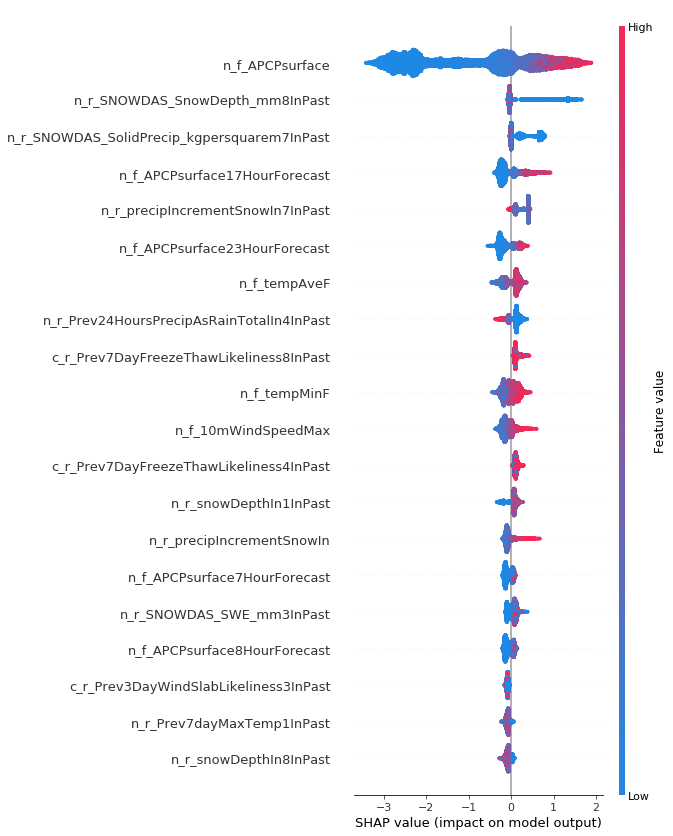

In [130]:
pl.gcf().set_size_inches(12, 12)
pl.show()

In [141]:
import operator
sorted_x = sorted(modelAbove.get_fscore().items(), key=operator.itemgetter(1), reverse=True)

In [142]:
sorted_x

[('n_f_APCPsurface', 541),
 ('n_r_Prev1DayPrecip', 483),
 ('n_r_Prev1DayMax10mWind', 456),
 ('n_r_Prev7DayMax10mWind1InPast', 436),
 ('n_f_tempAveF', 412),
 ('c_r_Prev3DayFreezeThawLikeliness8InPast', 408),
 ('n_r_snowDepthIn', 404),
 ('n_r_Prev3daySnowAccumulation8InPast', 383),
 ('n_r_precipIncrementSnowIn', 378),
 ('n_r_SNOWDAS_SnowDepth_mm8InPast', 373),
 ('n_f_tempMinF', 373),
 ('n_f_10mWindSpeedMax', 370),
 ('n_r_SNOWDAS_SnowDepth_mm', 370),
 ('n_r_Prev24HoursPrecipAsRainTotalIn8InPast', 362),
 ('n_r_Prev24HoursPrecipAsRainTotalIn4InPast', 356),
 ('c_r_Prev7DayFreezeThawLikeliness', 353),
 ('n_r_Prev7daySnowAccumulation', 345),
 ('n_f_tempMaxF', 344),
 ('n_r_snowDepthIn3InPast', 337),
 ('n_r_Prev3daySnowAccumulation2InPast', 331),
 ('n_r_SNOWDAS_Sublimation_micromm8InPast', 326),
 ('n_r_Prev3dayMaxTemp2InPast', 326),
 ('n_r_SNOWDAS_SWE_mm8InPast', 319),
 ('n_r_Prev1dayMinTemp', 318),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem8InPast', 314),
 ('n_r_Prev3DayMax10mWind', 309),
 ('c_r_Prev3DayFreezeThawLikeliness5InPast', 309),
 ('n_r_Prev24HoursPrecipAsRainTotalIn', 303),
 ('n_r_SNOWDAS_Sublimation_micromm7InPast', 299),
 ('n_r_SNOWDAS_Sublimation_micromm6InPast', 293),
 ('n_r_Prev24HoursPrecipAsRainTotalIn7InPast', 292),
 ('n_r_Prev7DayMax10mWind6InPast', 287),
 ('n_r_Prev1dayMaxTemp', 285),
 ('c_r_Prev7DayFreezeThawLikeliness8InPast', 285),
 ('n_r_SNOWDAS_SWE_mm3InPast', 284),
 ('n_r_snowDepthIn8InPast', 283),
 ('n_r_Prev3daySnowAccumulation', 283),
 ('n_r_Prev3dayMaxTemp7InPast', 267),
 ('n_r_SNOWDAS_SolidPrecip_kgpersquarem7InPast', 266),
 ('n_r_SNOWDAS_SolidPrecip_kgpersquarem8InPast', 264),
 ('n_r_Prev1dayMinTemp3InPast', 263),
 ('n_r_SNOWDAS_Sublimation_micromm3InPast', 261),
 ('n_r_Prev3dayMinTemp1InPast', 260),
 ('n_r_Prev1DayMax10mWind8InPast', 259),
 ('c_r_Prev3DayWindSlabLikeliness4InPast', 258),
 ('c_r_Prev7DayFreezeThawLikeliness4InPast', 252),
 ('n_r_SNOWDAS_SnowmeltRunoff_micromm8InPast', 251),
 ('n_r_Prev1dayMaxTemp6InPast', 251),
 ('n_r_Prev7dayMaxTemp1InPast', 250),
 ('c_r_Prev7DayWindSlabLikeliness7InPast', 250),
 ('n_r_Prev3dayMaxTemp', 245),
 ('n_r_SNOWDAS_SnowmeltRunoff_micromm1InPast', 245),
 ('n_r_Prev7daySnowAccumulation2InPast', 244),
 ('n_r_SNOWDAS_Sublimation_micromm', 243),
 ('n_r_Prev3dayMinTemp7InPast', 240),
 ('n_r_Prev7dayMinTemp', 240),
 ('n_r_SNOWDAS_SWE_mm1InPast', 238),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem7InPast', 238),
 ('n_r_Prev3DayMax10mWind1InPast', 236),
 ('n_f_APCPsurface23HourForecast', 234),
 ('n_r_snowDepthIn7InPast', 234),
 ('n_r_Prev3dayMinTemp', 234),
 ('n_r_snowDepthIn1InPast', 232),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem2InPast', 231),
 ('n_r_SNOWDAS_SWE_mm7InPast', 230),
 ('n_r_Prev7dayMaxTemp', 230),
 ('n_r_Prev1DayPrecip8InPast', 230),
 ('c_r_Prev3DayWindSlabLikeliness8InPast', 228),
 ('n_f_10mWindSpeed23HourForecast', 228),
 ('n_r_Prev1dayMinTemp5InPast', 227),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem', 225),
 ('c_r_Prev3DayWindSlabLikeliness7InPast', 224),
 ('n_r_SNOWDAS_Sublimation_micromm1InPast', 223),
 ('c_r_Prev7DayWindSlabLikeliness1InPast', 220),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem6InPast', 219),
 ('n_r_SNOWDAS_SnowDepth_mm7InPast', 218),
 ('n_r_snowDepthIn6InPast', 217),
 ('n_r_Prev3dayMaxTemp6InPast', 217),
 ('n_r_SNOWDAS_SnowmeltRunoff_micromm', 216),
 ('n_r_Prev7dayMinTemp6InPast', 215),
 ('c_r_Prev3DayFreezeThawLikeliness1InPast', 214),
 ('c_r_Prev3DayWindSlabLikeliness2InPast', 213),
 ('n_r_Prev1DayMax10mWind5InPast', 213),
 ('n_r_Prev1DayPrecip5InPast', 212),
 ('c_r_Prev7DayWindSlabLikeliness4InPast', 211),
 ('c_r_Prev7DayFreezeThawLikeliness7InPast', 209),
 ('n_r_SNOWDAS_SnowpackAveTemp_k', 209),
 ('n_r_SNOWDAS_LiquidPrecip_kgpersquarem1InPast', 207),
 ('n_r_SNOWDAS_SWE_mm6InPast', 207),
 ('n_r_SNOWDAS_SnowpackAveTemp_k2InPast', 206),
 ('n_r_Prev7DayMax10mWind5InPast', 206),
 ('n_r_SNOWDAS_SolidPrecip_kgpersquarem2InPast', 204),
 ('n_r_SNOWDAS_SnowmeltRunoff_micromm3InPast', 204),
 ('c_r_Prev3DayWindSlabLikeliness3InPast', 203),
 ('n_r_Prev7D

In [149]:
pd.Series(X_Above_train.columns).to_csv("columns.csv")

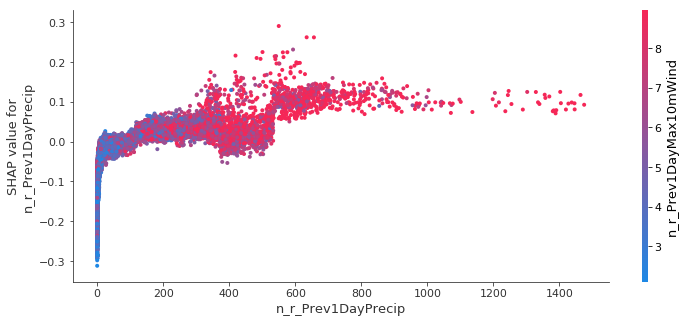

In [150]:
#high
shap.dependence_plot("n_r_Prev1DayPrecip", shap_values[:,1,:], X_Above_train, interaction_index=63, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

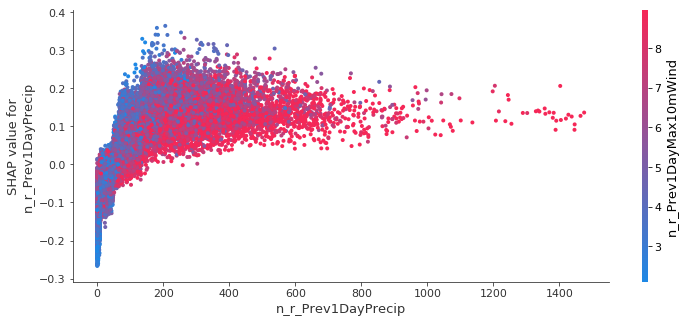

In [151]:
#considerable
shap.dependence_plot("n_r_Prev1DayPrecip", shap_values[:,0,:], X_Above_train, interaction_index=63, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

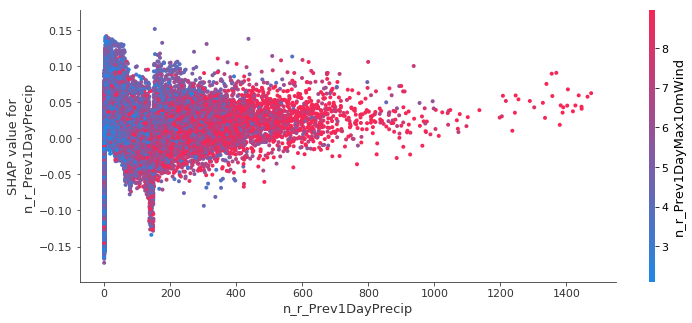

In [152]:
#Moderate
shap.dependence_plot("n_r_Prev1DayPrecip", shap_values[:,3,:], X_Above_train, interaction_index=63, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

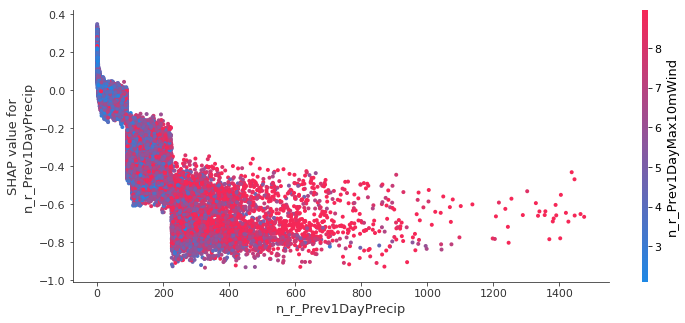

In [153]:
#Low
shap.dependence_plot("n_r_Prev1DayPrecip", shap_values[:,2,:], X_Above_train, interaction_index=63, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

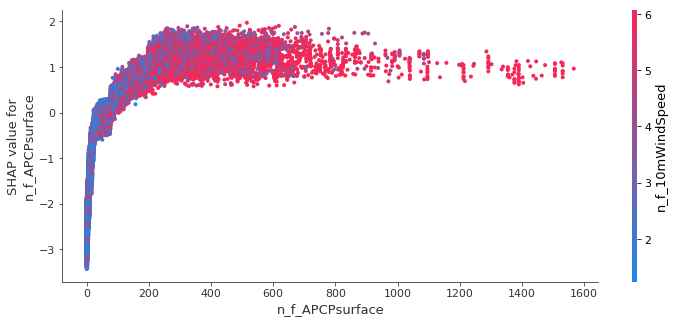

In [159]:
#high
shap.dependence_plot("n_f_APCPsurface", shap_values[:,1,:], X_Above_train, interaction_index=51, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

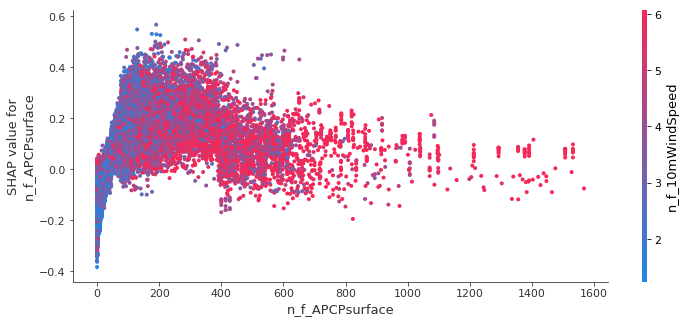

In [160]:
#considerable
shap.dependence_plot("n_f_APCPsurface", shap_values[:,0,:], X_Above_train, interaction_index=51, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

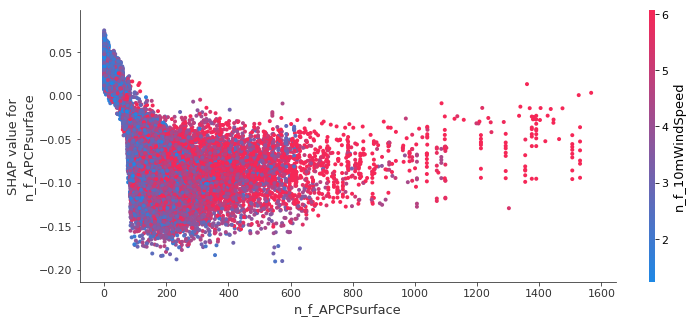

In [161]:
#Moderate
shap.dependence_plot("n_f_APCPsurface", shap_values[:,3,:], X_Above_train, interaction_index=51, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

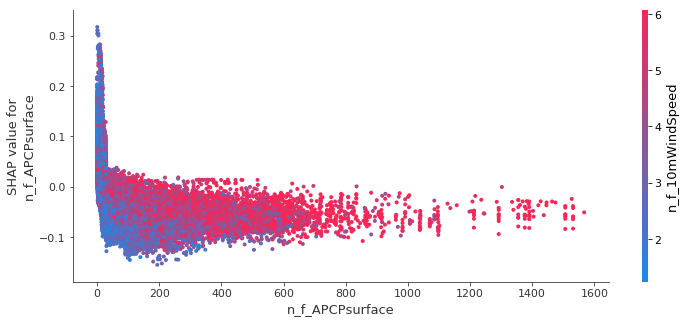

In [162]:
#Low
shap.dependence_plot("n_f_APCPsurface", shap_values[:,2,:], X_Above_train, interaction_index=51, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

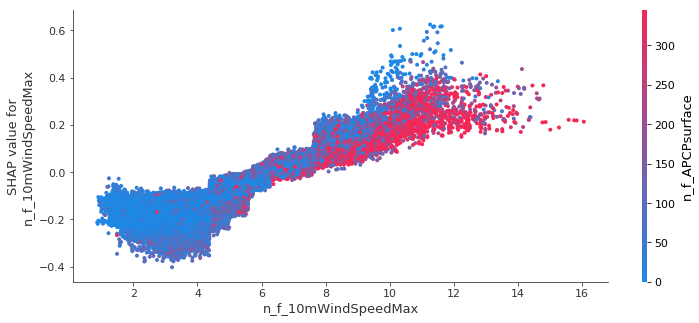

In [156]:
#high
shap.dependence_plot("n_f_10mWindSpeedMax", shap_values[:,1,:], X_Above_train, interaction_index=52, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

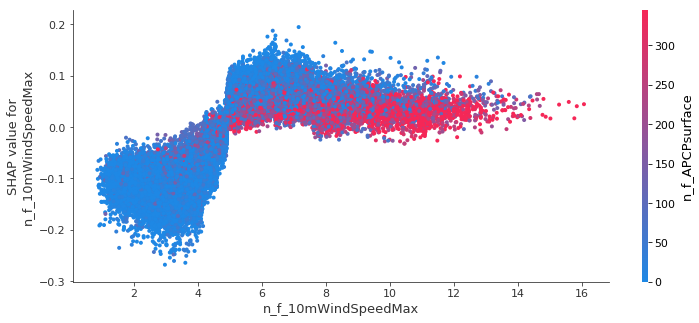

In [163]:
#considerable
shap.dependence_plot("n_f_10mWindSpeedMax", shap_values[:,0,:], X_Above_train, interaction_index=52, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

In [72]:
#parameters derived from a several step parameter search
grid = {'min_child_weight': 5, 'n_estimators': 250, 'colsample_bytree': 0.9, 'reg_alpha': 1, 'gamma': 1, 'learning_rate': 0.1, 'subsample': 0.9, 'objective': 'multi:softmax', 'max_depth': 7}

modelAbove = XGBClassifier()
modelAbove.set_params(**grid)

modelNear = XGBClassifier()
modelNear.set_params(**grid)

modelBelow = XGBClassifier()
modelBelow.set_params(**grid)

ValueError: Invalid parameter num_class for estimator XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1). Check the list of available parameters with `estimator.get_params().keys()`.

In [6]:
val = modelAbove.fit(X_Above_train, y_Above_train[yColumns].values.ravel())
valnear = modelNear.fit(X_Near_train, y_Near_train[yNearColumn].values.ravel())
valbelow = modelBelow.fit(X_Below_train, y_Below_train[yBelowColumn].values.ravel())

In [7]:
resultAbove = modelAbove.predict(X_Above_test)
resultNear = modelNear.predict(X_Near_test)
resultBelow = modelBelow.predict(X_Below_test)

C:\Users\scott\Anaconda3\envs\python35\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
C:\Users\scott\Anaconda3\envs\python35\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
C:\Users\scott\Anaconda3\envs\python35\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [3]:
def evaluateSingleClass(y_test, result):
    cm = confusion_matrix(y_test, result)
    print(cm)
    accuracy = accuracy_score(y_test.values, result)
    print("Accuracy: " + str(accuracy))
    print("Classification Report")
    print(classification_report(y_test.values, result))

def evaluateSingleClassShort(y_test, result):
    accuracy = accuracy_score(y_test.values, result)
    print("Accuracy: " + str(accuracy))
    print("Classification Report")
    print(classification_report(y_test.values, result))

#nice confustion matrix plot taken from scikit-learn docs
import itertools
import matplotlib.pyplot as plt
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Accuracy: 0.9667647452186706
Classification Report
              precision    recall  f1-score   support

Considerable       0.95      0.96      0.95      4450
        High       0.94      0.92      0.93      1077
         Low       0.98      0.99      0.99      3849
    Moderate       0.98      0.96      0.97      5578

 avg / total       0.97      0.97      0.97     14954

Normalized confusion matrix
Confusion matrix, without normalization


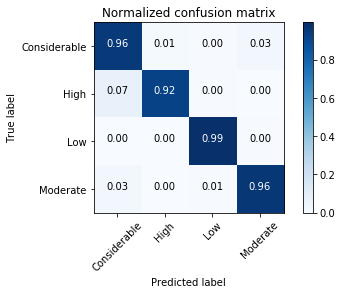

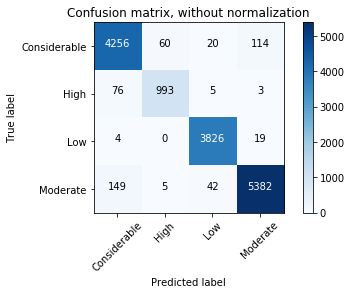

In [9]:
evaluateSingleClassShort(y_Above_test['o_day1DangerAboveTreeline'], resultAbove)
cnf_matrix = confusion_matrix(y_Above_test['o_day1DangerAboveTreeline'], resultAbove)
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'], normalize=True,
                      title='Normalized confusion matrix')
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'],
                      title='Confusion matrix, without normalization')
plt.show()

In [4]:
import shap
shap.initjs()

In [5]:
import xgboost

In [64]:
y_Above_train['o_day1DangerAboveTreeline'].astype('category').cat.codes

27509    3
58150    3
18841    3
32982    3
6467     1
23959    1
30032    3
34393    0
58140    2
37201    3
2945     3
12996    0
12355    0
34473    3
27153    3
4527     0
615      3
45206    0
69395    2
49110    3
14309    0
33882    1
36647    3
71820    2
53033    0
31972    3
24918    0
14936    0
22382    3
1020     2
        ..
57697    1
72231    2
24890    0
32094    1
26841    0
61422    2
63169    2
741      1
42789    0
27627    0
39751    0
24448    0
26178    0
40470    3
65296    2
8186     0
29123    2
6904     3
57101    3
32903    0
26868    2
41568    1
54585    1
7115     3
47898    3
27670    3
55254    3
71674    2
23801    0
43392    3
Length: 59813, dtype: int8

In [56]:
pd.Series(y_Above_train[yColumns].values.ravel()).astype('category').

0            Moderate
1            Moderate
2            Moderate
3            Moderate
4                High
5                High
6            Moderate
7        Considerable
8                 Low
9            Moderate
10           Moderate
11       Considerable
12       Considerable
13           Moderate
14           Moderate
15       Considerable
16           Moderate
17       Considerable
18                Low
19           Moderate
20       Considerable
21               High
22           Moderate
23                Low
24       Considerable
25           Moderate
26       Considerable
27       Considerable
28           Moderate
29                Low
             ...     
59783            High
59784             Low
59785    Considerable
59786            High
59787    Considerable
59788             Low
59789             Low
59790            High
59791    Considerable
59792    Considerable
59793    Considerable
59794    Considerable
59795    Considerable
59796        Moderate
59797     

In [39]:
catDf

[o_day1DangerAboveTreeline]
Categories (1, object): [o_day1DangerAboveTreeline]

In [6]:
trainDM = xgboost.DMatrix(X_Above_train, label=y_Above_train['o_day1DangerAboveTreeline'].astype('category').cat.codes)

In [7]:
testDM = xgboost.DMatrix(X_Above_test, label=y_Above_test['o_day1DangerAboveTreeline'].astype('category').cat.codes)

In [8]:
params = {'min_child_weight': 5, 'n_estimators': 250, 'colsample_bytree': 0.9, 'reg_alpha': 1, 'gamma': 1, 'learning_rate': 0.1, 'subsample': 0.9, 'objective': 'multi:softmax', 'max_depth': 7, 'num_class': 4}


In [9]:
model_above_train = xgboost.train(params, trainDM, 300, evals=[(testDM, "test")], verbose_eval=50)

[0]	test-merror:0.246422
[50]	test-merror:0.091414
[100]	test-merror:0.055035
[150]	test-merror:0.042263
[200]	test-merror:0.034974
[250]	test-merror:0.032567
[300]	test-merror:0.030895
[350]	test-merror:0.030761
[400]	test-merror:0.030627
[450]	test-merror:0.030293
[500]	test-merror:0.030293
[550]	test-merror:0.030226
[600]	test-merror:0.030293
[650]	test-merror:0.030092
[700]	test-merror:0.029959
[750]	test-merror:0.029758
[800]	test-merror:0.029959
[850]	test-merror:0.029624
[900]	test-merror:0.029557
[950]	test-merror:0.029892
[999]	test-merror:0.029892


In [10]:
resultAbove = model_above_train.predict(testDM)

In [11]:
resultAbove

array([3., 0., 3., ..., 3., 0., 3.], dtype=float32)

In [12]:
evaluateSingleClassShort(y_Above_test['o_day1DangerAboveTreeline'].astype('category').cat.codes, resultAbove)

Accuracy: 0.9701083322188043
Classification Report
             precision    recall  f1-score   support

          0       0.95      0.96      0.96      4450
          1       0.95      0.93      0.94      1077
          2       0.99      1.00      0.99      3849
          3       0.98      0.97      0.97      5578

avg / total       0.97      0.97      0.97     14954



In [55]:
y_Above_train['o_day1DangerAboveTreeline'].head()

27509    Moderate
58150    Moderate
18841    Moderate
32982    Moderate
6467         High
Name: o_day1DangerAboveTreeline, dtype: object

In [13]:
shap_values = shap.TreeExplainer(model_above_train).shap_values(trainDM)

In [14]:
shap_values[:,0,:].shape

(59813, 342)

In [15]:
X_Above_train.shape

(59813, 341)

In [57]:
row = 0
y_Above_train['o_day1DangerAboveTreeline'][row]

'Moderate'

In [59]:
#Moderate: 3
#High: 1
#Considerable: 0
#Low: 2
forecast = 0
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])

In [60]:
forecast = 1
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])

In [61]:
forecast = 2
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])

In [62]:
forecast = 3
shap.force_plot(shap_values[row,forecast,:], X_Above_train.iloc[row,:])

In [17]:
import matplotlib.pylab as pl

In [18]:
shap.dependence_plot("n_r_SNOWDAS_SolidPrecip_kgpersquarem", shap_values[:,0,:], X_Above_train, show=False)
pl.gcf().set_size_inches(12, 5)
pl.show()

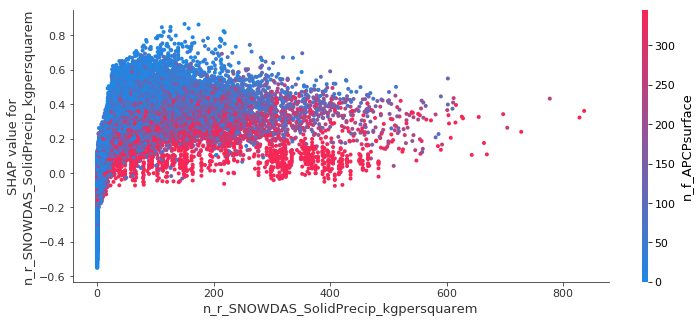

In [19]:
pl.gcf().set_size_inches(12, 5)
pl.show()

In [20]:
shap.summary_plot(shap_values[:,0,:], X_Above_train, show=False)

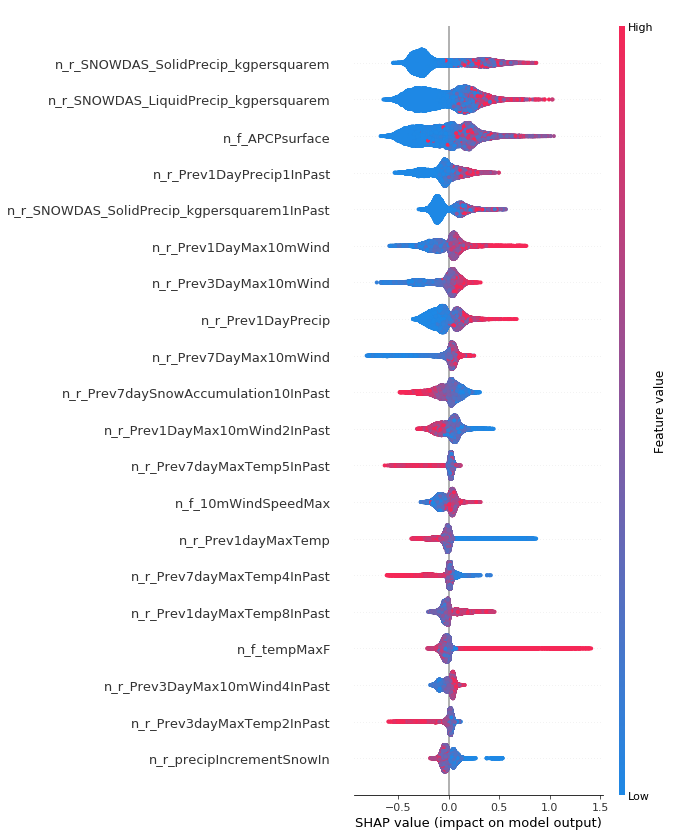

In [21]:
pl.gcf().set_size_inches(12, 12)
pl.show()

In [25]:
shap.force_plot(shap_values[:500,0,:], X_Above_train[:500])

In [31]:
print(pl.__version__)

1.14.1


Accuracy: 0.9575364450983015
Classification Report
              precision    recall  f1-score   support

Considerable       0.94      0.94      0.94      3515
        High       0.96      0.91      0.94       779
         Low       0.98      0.98      0.98      4688
    Moderate       0.96      0.96      0.96      5972

 avg / total       0.96      0.96      0.96     14954

Normalized confusion matrix
Confusion matrix, without normalization


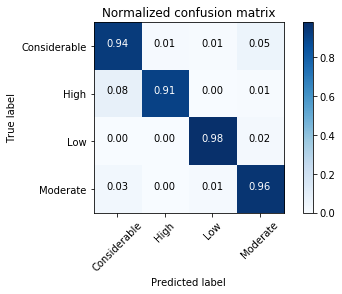

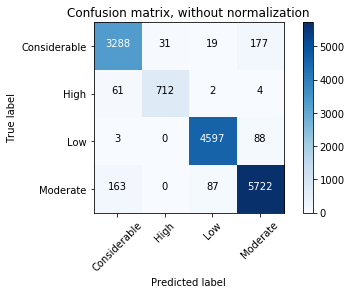

In [16]:


cnf_matrix = confusion_matrix(y_Near_test['o_day1DangerNearTreeline'], resultNear)
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'], normalize=True,
                      title='Normalized confusion matrix')
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'],
                      title='Confusion matrix, without normalization')
plt.show()

Accuracy: 0.9614818777584593
Classification Report
              precision    recall  f1-score   support

Considerable       0.93      0.93      0.93      1839
        High       0.96      0.92      0.94       157
         Low       0.98      0.98      0.98      7115
    Moderate       0.95      0.95      0.95      5843

 avg / total       0.96      0.96      0.96     14954

Normalized confusion matrix
Confusion matrix, without normalization


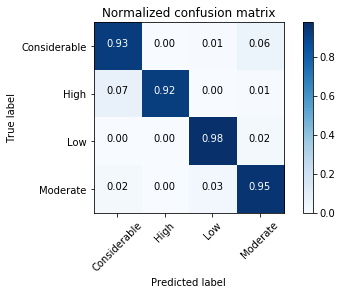

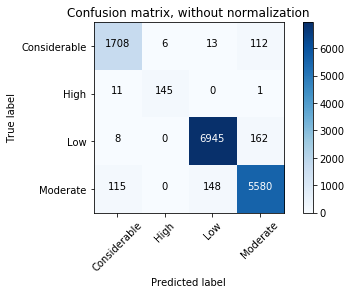

In [17]:
evaluateSingleClassShort(y_Below_test['o_day1DangerBelowTreeline'], resultBelow)
cnf_matrix = confusion_matrix(y_Below_test['o_day1DangerBelowTreeline'], resultBelow)
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'], normalize=True,
                      title='Normalized confusion matrix')
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Considerable', 'High', 'Low', 'Moderate'],
                      title='Confusion matrix, without normalization')
plt.show()

In [18]:
#check out the feature importances
featureImportance = dict(zip(X_Above_train.columns, modelAbove.feature_importances_))
sortedFeatureImportance = sorted(featureImportance, key=featureImportance.get, reverse=True)

In [ ]:
#save the models
modelAbove._Booster.save_model("ModelAboveV1.bin")
modelNear._Booster.save_model("ModelNearV1.bin")
modelBelow._Booster.save_model("ModelBelowV1.bin")